In [89]:
# Import Libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from prophet import Prophet
from statsmodels.tsa.arima.model import ARIMA

from sklearn.metrics import mean_absolute_error, mean_squared_error

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# **Data Preprocessing**

In [90]:
# Load the dataset
df = pd.read_csv('data/data.csv')
df.head()

,structure,strucuture_id,structure_name,action,ref_area,reference_area,measure,measures,unit_measure,unit_of_measure,...,time_period,time_periods,obs_value,obs_values,obs_status,obs_statuses,unit_multiplier,unit_multipliers,decimal,decimals
0,DATAFLOW,OECD.ELS.SAE:DSD_LFS@DF_LFS(1.1),Employment and unemployment by five-year age g...,I,ESP,Spain,POP,Population,PS,Persons,...,1972,NaN,31.5,NaN,A,Normal value,3,Thousands,0.0,Zero
1,DATAFLOW,OECD.ELS.SAE:DSD_LFS@DF_LFS(1.1),Employment and unemployment by five-year age g...,I,ESP,Spain,POP,Population,PS,Persons,...,1973,NaN,55.5,NaN,A,Normal value,3,Thousands,0.0,Zero
2,DATAFLOW,OECD.ELS.SAE:DSD_LFS@DF_LFS(1.1),Employment and unemployment by five-year age g...,I,ESP,Spain,POP,Population,PS,Persons,...,1974,NaN,72.0,NaN,A,Normal value,3,Thousands,0.0,Zero
3,DATAFLOW,OECD.ELS.SAE:DSD_LFS@DF_LFS(1.1),Employment and unemployment by five-year age g...,I,ESP,Spain,POP,Population,PS,Persons,...,1975,NaN,95.2,NaN,A,Normal value,3,Thousands,0.0,Zero
4,DATAFLOW,OECD.ELS.SAE:DSD_LFS@DF_LFS(1.1),Employment and unemployment by five-year age g...,I,ESP,Spain,POP,Population,PS,Persons,...,1976,NaN,132.9,NaN,A,Normal value,3,Thousands,0.0,Zero


In [91]:
df.columns


Index(['structure', 'strucuture_id', 'structure_name', 'action', 'ref_area',
       'reference_area', 'measure', 'measures', 'unit_measure',
       'unit_of_measure', 'sex', 'sexes', 'age', 'ages', 'labour_force_status',
       'labour_force_statuses', 'time_period', 'time_periods', 'obs_value',
       'obs_values', 'obs_status', 'obs_statuses', 'unit_multiplier',
       'unit_multipliers', 'decimal', 'decimals'],
      dtype='object')

In [92]:
# Data Preparation

# Filter for relevant labour force statuses
df_emp = df[df['labour_force_status'].isin(['EMP', 'UNE'])].copy()
# Pivot to get EMP and UNE as columns
df_pivot = df_emp.pivot_table(index='time_period', columns='labour_force_status', values='obs_value', aggfunc='sum')
# Calculate unemployment rate
df_pivot['unemployment_rate'] = (df_pivot['UNE'] / (df_pivot['EMP'] + df_pivot['UNE'])) * 100
# Reset index and sort by time_period
df_pivot = df_pivot.reset_index().sort_values('time_period')
df_pivot['time_period'] = pd.to_numeric(df_pivot['time_period'], errors='coerce')
df_pivot['unemployment_rate'] = df_pivot['unemployment_rate'].interpolate()

df_pivot.head()


labour_force_status,time_period,EMP,UNE,unemployment_rate
0,1960,1974200.0,106116.0,5.100956
1,1961,1998226.6,131656.4,6.181391
2,1962,2008764.0,107152.0,5.064095
3,1963,2223564.0,113617.2,4.861292
4,1964,2265012.8,104880.8,4.425549


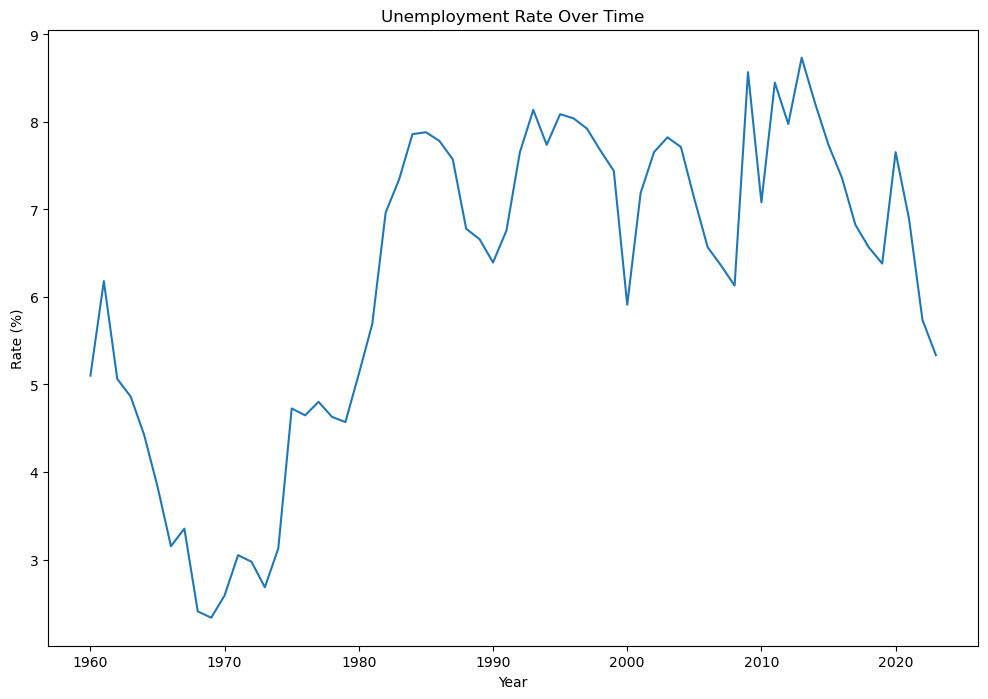

In [93]:
# Explnatory Analysis
plt.figure(figsize=(12, 8))
plt.plot(df_pivot['time_period'], df_pivot['unemployment_rate'])
plt.title("Unemployment Rate Over Time")
plt.xlabel("Year")
plt.ylabel("Rate (%)")
plt.show()

In [94]:
# Train-Test Split
train_size = int(len(df_pivot) * 0.8)

train = df_pivot[:train_size]
test = df_pivot[train_size:]

print(f"Training set: {len(train)} samples")
print(f"Test set: {len(test)} samples")

Training set: 51 samples
Test set: 13 samples


# **Models**

# Baseline Model

In [95]:
# Baseline Model(NAIVE)
# The naive forecast assumes that the next value will be the same as the current value.

test['naive'] = train['unemployment_rate'].iloc[-1]

# ARIMA Model

In [96]:
# ARIMA Model
model_arima = ARIMA(train['unemployment_rate'], order=(1,1,1))
model_arima_fit = model_arima.fit()

forecast_arima = model_arima_fit.forecast(steps=len(test))

# Prophet Model

In [97]:
# Prophet Model
df_prophet = train[['time_period', 'unemployment_rate']]
df_prophet.columns = ['ds', 'y']

df_prophet['ds'] = pd.to_datetime(df_prophet['ds'], format='%Y')

# Train the model
model_prophet = Prophet()
model_prophet.fit(df_prophet)

15:20:33 - cmdstanpy - INFO - Chain [1] start processing
15:20:33 - cmdstanpy - INFO - Chain [1] done processing


In [98]:
# Forecast
future = model_prophet.make_future_dataframe(periods=len(test), freq='Y')
forecast = model_prophet.predict(future)

forecast_prophet = forecast['yhat'].iloc[-len(test):].values

# Model Evaluation

In [99]:
# Model Evaluation
results = pd.DataFrame({
    "Model": ["Naïve", "ARIMA", "Prophet"],
    "RMSE": [
        np.sqrt(mean_squared_error(test['unemployment_rate'], test['naive'])),
        np.sqrt(mean_squared_error(test['unemployment_rate'], forecast_arima)),
        np.sqrt(mean_squared_error(test['unemployment_rate'], forecast_prophet))
    ],
    "MAE": [
        mean_absolute_error(test['unemployment_rate'], test['naive']),
        mean_absolute_error(test['unemployment_rate'], forecast_arima),
        mean_absolute_error(test['unemployment_rate'], forecast_prophet)
    ]
})

print(results)

     Model      RMSE       MAE
0    Naïve  1.008735  0.869537
1    ARIMA  1.007130  0.884483
2  Prophet  2.052995  1.657410


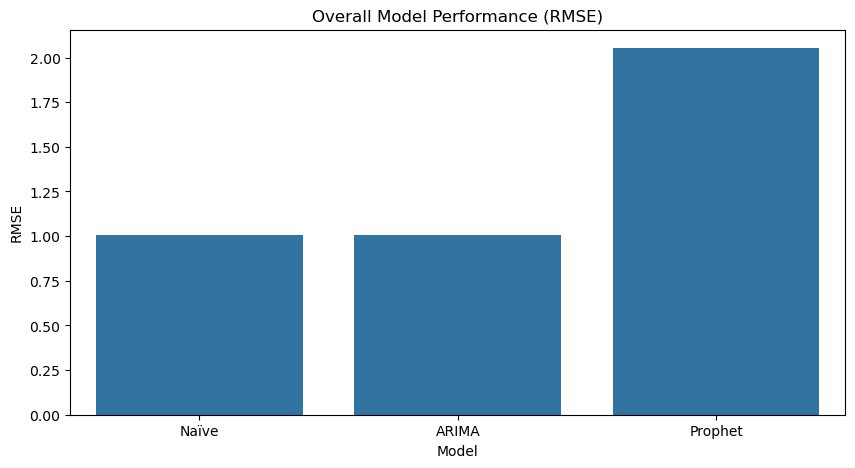

In [100]:
plt.figure(figsize=(10,5))
sns.barplot(data=results, x="Model", y="RMSE")
plt.title("Overall Model Performance (RMSE)")
plt.show()

# Visualization of Predictions

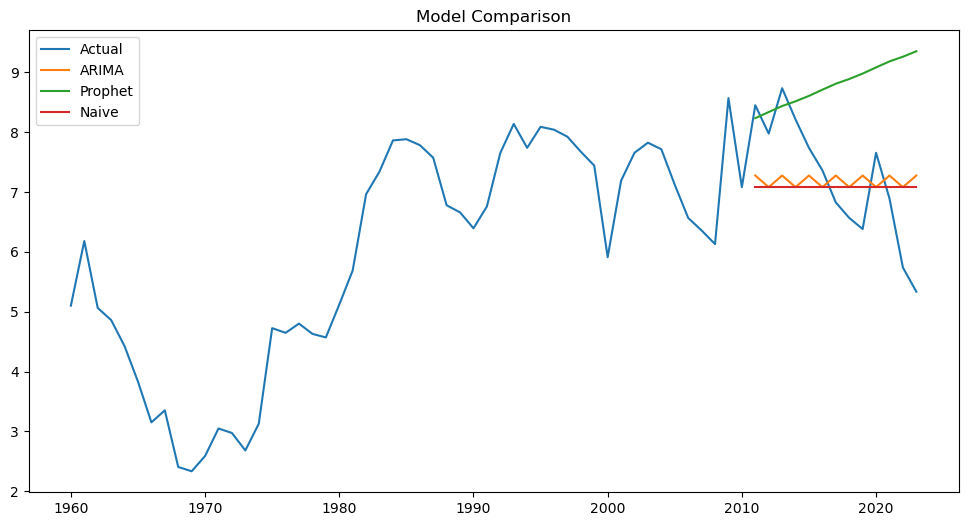

In [101]:
# Visualization of Predictions
plt.figure(figsize=(12, 6))

plt.plot(df_pivot['time_period'], df_pivot['unemployment_rate'], label='Actual')
plt.plot(test['time_period'], forecast_arima, label='ARIMA')
plt.plot(test['time_period'], forecast_prophet, label='Prophet')
plt.plot(test['time_period'], test['naive'], label='Naive')

plt.legend()
plt.title("Model Comparison")
plt.show()

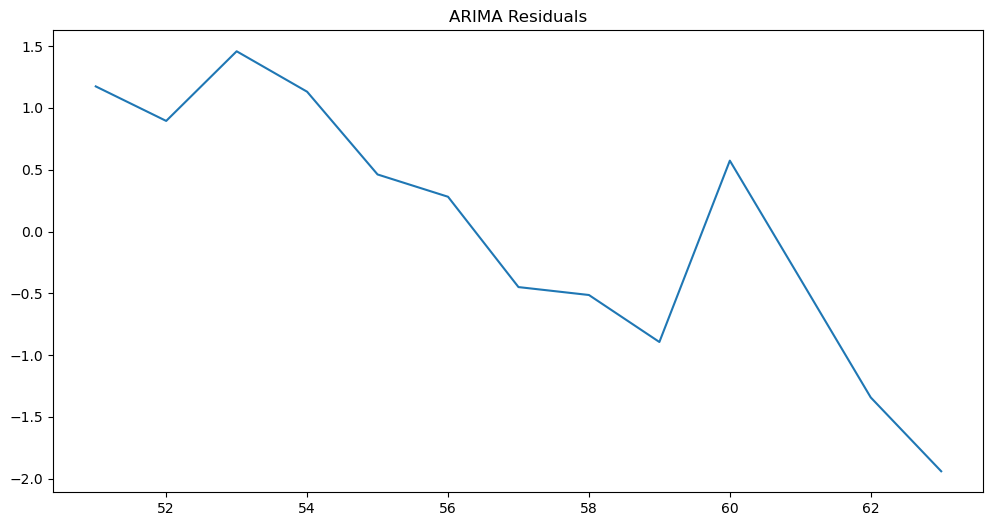

In [102]:
# Residual Analysis of ARIMA Model
residuals_arima = test['unemployment_rate'] - forecast_arima

plt.figure(figsize=(12, 6))
plt.plot(residuals_arima)
plt.title("ARIMA Residuals")
plt.show()

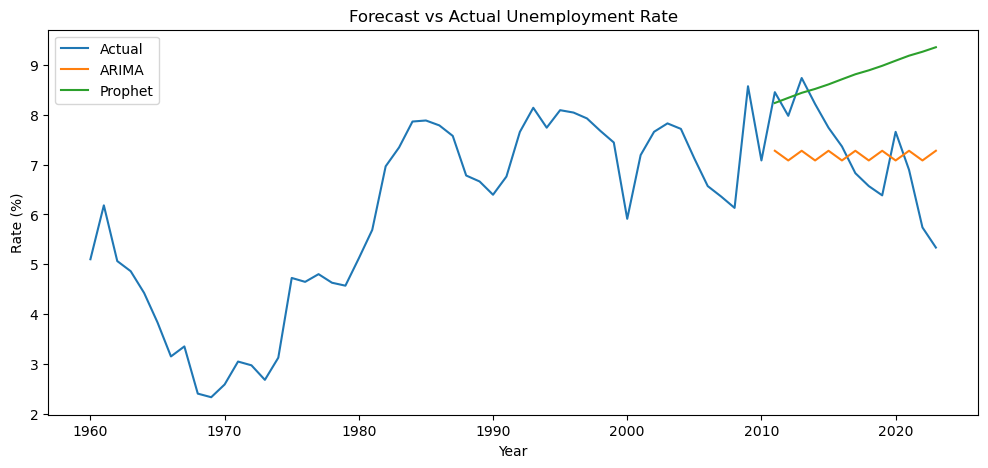

In [103]:
plt.figure(figsize=(12,5))

plt.plot(df_pivot['time_period'], df_pivot['unemployment_rate'], label='Actual')
plt.plot(test['time_period'], forecast_arima, label='ARIMA')
plt.plot(test['time_period'], forecast_prophet, label='Prophet')


plt.legend()
plt.title("Forecast vs Actual Unemployment Rate")
plt.xlabel("Year")
plt.ylabel("Rate (%)")
plt.show()

# **GROUP ANALYSIS(AGE GROUPS/SEX)**

# Reusable Function to evaluate the models

In [104]:
def evaluate_models(df, group_name="Overall"):
    from statsmodels.tsa.arima.model import ARIMA
    from prophet import Prophet
    from sklearn.metrics import mean_squared_error, mean_absolute_error
    import numpy as np
    import pandas as pd

    # Sort
    df = df.sort_values('time_period')

    # Train/test split
    train_size = int(len(df) * 0.8)
    train = df[:train_size]
    test = df[train_size:]

   # NAIVE
    naive_pred = [train['unemployment_rate'].iloc[-1]] * len(test)

    # ARIMA
    try:
        model_arima = ARIMA(train['unemployment_rate'], order=(1,1,1))
        model_arima_fit = model_arima.fit()
        arima_pred = model_arima_fit.forecast(steps=len(test))
    except:
        arima_pred = [np.nan] * len(test)

    # PROPHET
    try:
        df_prophet = train[['time_period', 'unemployment_rate']]
        df_prophet.columns = ['ds', 'y']
        df_prophet['ds'] = pd.to_datetime(df_prophet['ds'], format='%Y')

        model_prophet = Prophet()
        model_prophet.fit(df_prophet)

        future = model_prophet.make_future_dataframe(periods=len(test), freq='Y')
        forecast = model_prophet.predict(future)

        prophet_pred = forecast['yhat'].iloc[-len(test):].values
    except:
        prophet_pred = [np.nan] * len(test)

    # METRICS FUNCTION
    def compute_metrics(true, pred):
        return (
            np.sqrt(mean_squared_error(true, pred)),
            mean_absolute_error(true, pred)
        )

    rmse_naive, mae_naive = compute_metrics(test['unemployment_rate'], naive_pred)
    rmse_arima, mae_arima = compute_metrics(test['unemployment_rate'], arima_pred)
    rmse_prophet, mae_prophet = compute_metrics(test['unemployment_rate'], prophet_pred)

    return pd.DataFrame({
        "Group": [group_name]*3,
        "Model": ["Naive", "ARIMA", "Prophet"],
        "RMSE": [rmse_naive, rmse_arima, rmse_prophet],
        "MAE": [mae_naive, mae_arima, mae_prophet]
    })

In [105]:
df_age = df[df['age'] == 25]
df_age.columns

Index(['structure', 'strucuture_id', 'structure_name', 'action', 'ref_area',
       'reference_area', 'measure', 'measures', 'unit_measure',
       'unit_of_measure', 'sex', 'sexes', 'age', 'ages', 'labour_force_status',
       'labour_force_statuses', 'time_period', 'time_periods', 'obs_value',
       'obs_values', 'obs_status', 'obs_statuses', 'unit_multiplier',
       'unit_multipliers', 'decimal', 'decimals'],
      dtype='object')

# Age Group Analysis

In [106]:
results_age = pd.DataFrame()

for age in df['age'].unique():
    
    df_age = df[df['age'] == age]

    # Pivot
    df_pivot = df_age.pivot_table(
        index='time_period',
        columns='labour_force_status',
        values='obs_value',
        aggfunc='mean'
    ).reset_index()

    # Compute unemployment rate
    if 'EMP' in df_pivot and 'UNE' in df_pivot:
        df_pivot['unemployment_rate'] = (
            df_pivot['UNE'] / (df_pivot['EMP'] + df_pivot['UNE'])
        ) * 100

        df_pivot['unemployment_rate'] = df_pivot['unemployment_rate'].interpolate()

        res = evaluate_models(df_pivot, group_name=f"Age {age}")
        results_age = pd.concat([results_age, res])
print(results_age)        

15:20:34 - cmdstanpy - INFO - Chain [1] start processing
15:20:34 - cmdstanpy - INFO - Chain [1] done processing
15:20:34 - cmdstanpy - INFO - Chain [1] start processing
15:20:34 - cmdstanpy - INFO - Chain [1] done processing
15:20:34 - cmdstanpy - INFO - Chain [1] start processing
15:20:35 - cmdstanpy - INFO - Chain [1] done processing
15:20:35 - cmdstanpy - INFO - Chain [1] start processing
15:20:35 - cmdstanpy - INFO - Chain [1] done processing
15:20:35 - cmdstanpy - INFO - Chain [1] start processing
15:20:35 - cmdstanpy - INFO - Chain [1] done processing
15:20:35 - cmdstanpy - INFO - Chain [1] start processing
15:20:35 - cmdstanpy - INFO - Chain [1] done processing
15:20:35 - cmdstanpy - INFO - Chain [1] start processing
15:20:36 - cmdstanpy - INFO - Chain [1] done processing
15:20:36 - cmdstanpy - INFO - Chain [1] start processing
15:20:36 - cmdstanpy - INFO - Chain [1] done processing
15:20:36 - cmdstanpy - INFO - Chain [1] start processing
15:20:36 - cmdstanpy - INFO - Chain [1]

        Group    Model       RMSE        MAE
0  Age Y15T24    Naive   2.269796   2.016858
1  Age Y15T24    ARIMA   1.989984   1.732861
2  Age Y15T24  Prophet   3.098999   2.475927
0  Age Y50T54    Naive   0.898422   0.751304
1  Age Y50T54    ARIMA   0.736145   0.645057
2  Age Y50T54  Prophet   1.488822   1.173272
0  Age Y25T34    Naive   1.173950   1.004907
1  Age Y25T34    ARIMA   1.127403   0.987149
2  Age Y25T34  Prophet   2.284910   1.825298
0  Age Y30T34    Naive   1.125838   0.965689
1  Age Y30T34    ARIMA   1.100740   0.986249
2  Age Y30T34  Prophet   2.106623   1.664781
0  Age Y25T64    Naive   0.960634   0.833540
1  Age Y25T64    ARIMA   0.962001   0.846804
2  Age Y25T64  Prophet   1.960202   1.570995
0  Age Y55T59    Naive   0.888358   0.750865
1  Age Y55T59    ARIMA   0.888780   0.751146
2  Age Y55T59  Prophet   2.049987   1.707436
0  Age Y25T54    Naive   0.987983   0.853983
1  Age Y25T54    ARIMA   0.983017   0.867789
2  Age Y25T54  Prophet   1.942113   1.546589
0  Age Y_G

In [107]:
pd.set_option('display.max_rows', None)
print(results_age)

        Group    Model       RMSE        MAE
0  Age Y15T24    Naive   2.269796   2.016858
1  Age Y15T24    ARIMA   1.989984   1.732861
2  Age Y15T24  Prophet   3.098999   2.475927
0  Age Y50T54    Naive   0.898422   0.751304
1  Age Y50T54    ARIMA   0.736145   0.645057
2  Age Y50T54  Prophet   1.488822   1.173272
0  Age Y25T34    Naive   1.173950   1.004907
1  Age Y25T34    ARIMA   1.127403   0.987149
2  Age Y25T34  Prophet   2.284910   1.825298
0  Age Y30T34    Naive   1.125838   0.965689
1  Age Y30T34    ARIMA   1.100740   0.986249
2  Age Y30T34  Prophet   2.106623   1.664781
0  Age Y25T64    Naive   0.960634   0.833540
1  Age Y25T64    ARIMA   0.962001   0.846804
2  Age Y25T64  Prophet   1.960202   1.570995
0  Age Y55T59    Naive   0.888358   0.750865
1  Age Y55T59    ARIMA   0.888780   0.751146
2  Age Y55T59  Prophet   2.049987   1.707436
0  Age Y25T54    Naive   0.987983   0.853983
1  Age Y25T54    ARIMA   0.983017   0.867789
2  Age Y25T54  Prophet   1.942113   1.546589
0  Age Y_G

## Age group comparision

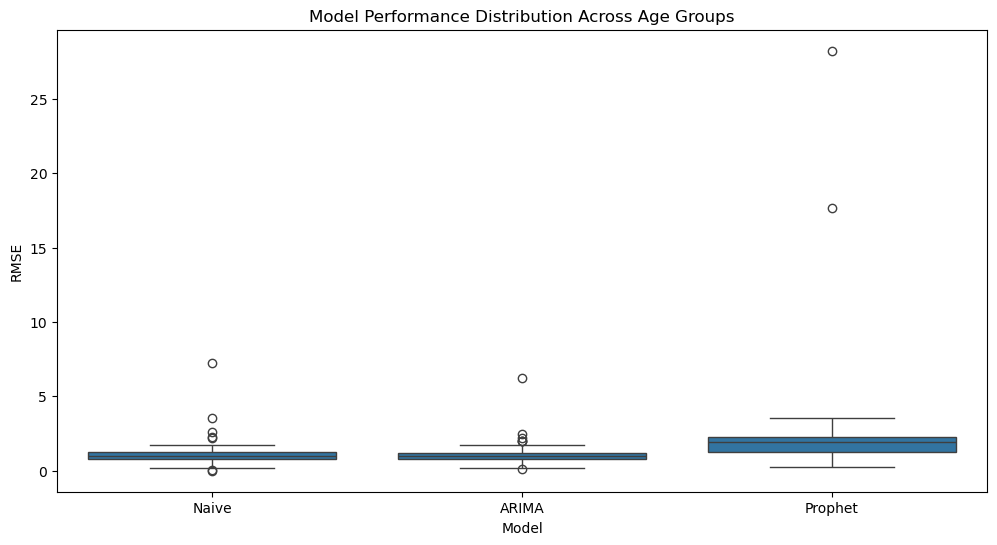

In [108]:
plt.figure(figsize=(12,6))
sns.boxplot(data=results_age, x="Model", y="RMSE")
plt.title("Model Performance Distribution Across Age Groups")
plt.show()

## Youth vs Older Prediction Error

In [109]:
young = results_age[results_age['Group'].str.contains("15|20")]
old = results_age[results_age['Group'].str.contains("60|65|70")]

print("Young RMSE mean:", young.groupby("Model")["RMSE"].mean())
print("Old RMSE mean:", old.groupby("Model")["RMSE"].mean())

Young RMSE mean: Model
ARIMA      1.531012
Naive      1.690782
Prophet    2.665624
Name: RMSE, dtype: float64
Old RMSE mean: Model
ARIMA      0.513023
Naive      0.513278
Prophet    0.928678
Name: RMSE, dtype: float64


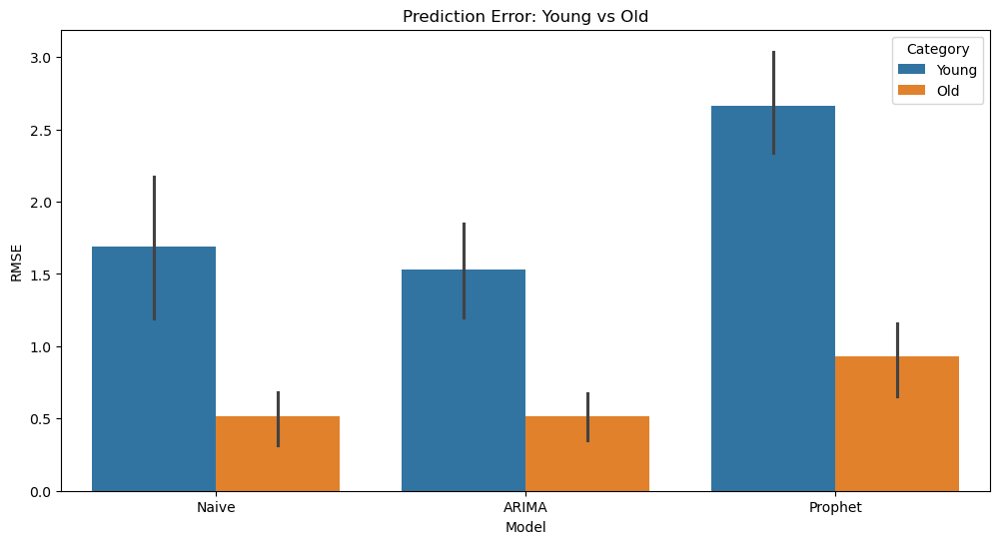

In [110]:
comparison = pd.concat([
    young.assign(Category="Young"),
    old.assign(Category="Old")
])

plt.figure(figsize=(12,6))
sns.barplot(data=comparison, x="Model", y="RMSE", hue="Category")
plt.title("Prediction Error: Young vs Old")
plt.show()

# Gender Analysis

In [111]:
results_gender = pd.DataFrame()

for gender in df['sex'].unique():
    
    df_gender = df[df['sex'] == gender]

    df_pivot = df_gender.pivot_table(
        index='time_period',
        columns='labour_force_status',
        values='obs_value',
        aggfunc='mean'
    ).reset_index()

    if 'EMP' in df_pivot and 'UNE' in df_pivot:
        df_pivot['unemployment_rate'] = (
            df_pivot['UNE'] / (df_pivot['EMP'] + df_pivot['UNE'])
        ) * 100

        df_pivot['unemployment_rate'] = df_pivot['unemployment_rate'].interpolate()

        res = evaluate_models(df_pivot, group_name=f"Gender {gender}")
        results_gender = pd.concat([results_gender, res])

15:20:45 - cmdstanpy - INFO - Chain [1] start processing
15:20:45 - cmdstanpy - INFO - Chain [1] done processing
15:20:45 - cmdstanpy - INFO - Chain [1] start processing
15:20:45 - cmdstanpy - INFO - Chain [1] done processing
15:20:45 - cmdstanpy - INFO - Chain [1] start processing
15:20:46 - cmdstanpy - INFO - Chain [1] done processing


In [112]:
results_gender

,Group,Model,RMSE,MAE
0,Gender F,Naive,1.027855,0.889333
1,Gender F,ARIMA,1.031405,0.908829
2,Gender F,Prophet,2.495509,2.103977
0,Gender M,Naive,0.995095,0.850400
1,Gender M,ARIMA,0.996838,0.866732
2,Gender M,Prophet,1.778631,1.430795
0,Gender _T,Naive,1.008404,0.869427
1,Gender _T,ARIMA,1.006843,0.884486
2,Gender _T,Prophet,2.074385,1.676582


## Gender Comparision

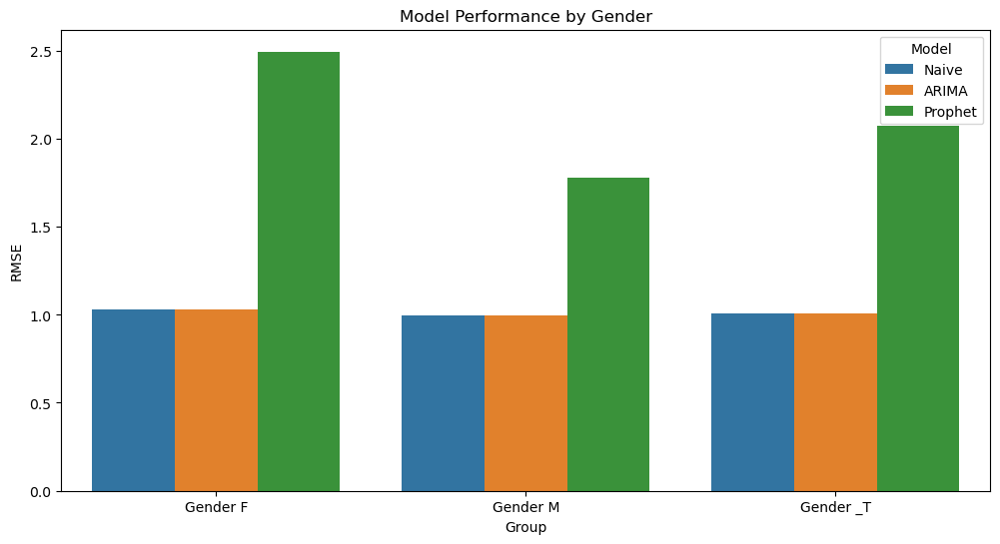

In [113]:
plt.figure(figsize=(12,6))
sns.barplot(data=results_gender, x="Group", y="RMSE", hue="Model")
plt.title("Model Performance by Gender")
plt.show()

# Country/Continent Analysis

In [114]:
results_country = pd.DataFrame()

top_countries = df['reference_area'].unique()[:10]  # limit to avoid overload

for country in top_countries:
    
    df_c = df[df['reference_area'] == country]

    df_pivot = df_c.pivot_table(
        index='time_period',
        columns='labour_force_status',
        values='obs_value',
        aggfunc='mean'
    ).reset_index()

    if 'EMP' in df_pivot and 'UNE' in df_pivot:
        df_pivot['unemployment_rate'] = (
            df_pivot['UNE'] / (df_pivot['EMP'] + df_pivot['UNE'])
        ) * 100

        df_pivot['unemployment_rate'] = df_pivot['unemployment_rate'].interpolate()

        res = evaluate_models(df_pivot, group_name=f"Country {country}")
        results_country = pd.concat([results_country, res])

15:20:46 - cmdstanpy - INFO - Chain [1] start processing
15:20:46 - cmdstanpy - INFO - Chain [1] done processing
15:20:46 - cmdstanpy - INFO - Chain [1] start processing
15:20:46 - cmdstanpy - INFO - Chain [1] done processing
15:20:46 - cmdstanpy - INFO - Chain [1] start processing
15:20:46 - cmdstanpy - INFO - Chain [1] done processing
15:20:46 - cmdstanpy - INFO - Chain [1] start processing
15:20:47 - cmdstanpy - INFO - Chain [1] done processing
15:20:47 - cmdstanpy - INFO - Chain [1] start processing
15:20:47 - cmdstanpy - INFO - Chain [1] done processing
15:20:47 - cmdstanpy - INFO - Chain [1] start processing
15:20:47 - cmdstanpy - INFO - Chain [1] done processing
15:20:47 - cmdstanpy - INFO - Chain [1] start processing
15:20:47 - cmdstanpy - INFO - Chain [1] done processing
15:20:47 - cmdstanpy - INFO - Chain [1] start processing
15:20:48 - cmdstanpy - INFO - Chain [1] done processing
15:20:48 - cmdstanpy - INFO - Chain [1] start processing
15:20:48 - cmdstanpy - INFO - Chain [1]

In [115]:
results_country

,Group,Model,RMSE,MAE
0,Country Spain,Naive,8.394378,7.331700
1,Country Spain,ARIMA,13.138886,11.922696
2,Country Spain,Prophet,6.009944,5.425489
0,Country United Kingdom,Naive,1.177683,1.090770
1,Country United Kingdom,ARIMA,0.746012,0.617574
2,Country United Kingdom,Prophet,0.422244,0.380337
0,Country OECD,Naive,2.240553,1.936851
1,Country OECD,ARIMA,2.183540,1.870981
2,Country OECD,Prophet,2.040904,1.690480
0,Country Germany,Naive,1.628305,1.456692


## Country Comparision

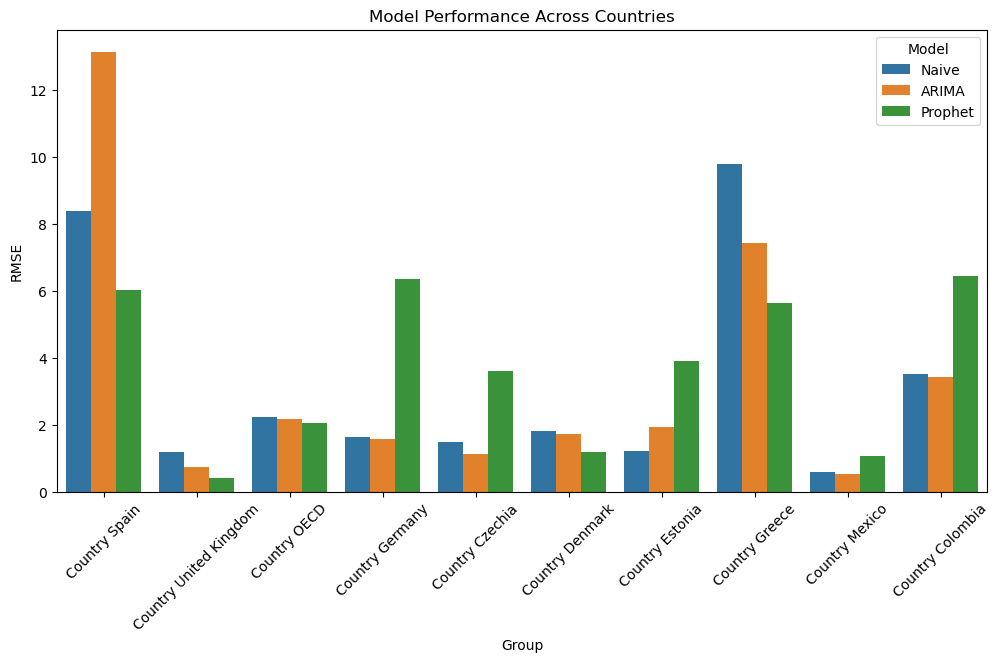

In [116]:
plt.figure(figsize=(12,6))
sns.barplot(data=results_country, x="Group", y="RMSE", hue="Model")
plt.xticks(rotation=45)
plt.title("Model Performance Across Countries")
plt.show()

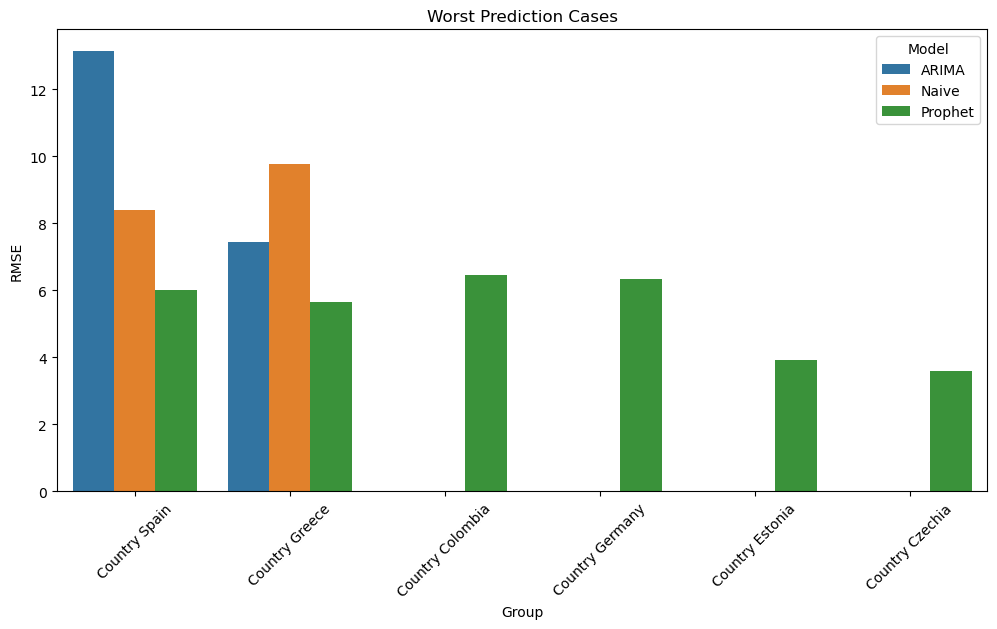

In [117]:
top = results_country.sort_values("RMSE", ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(data=top, x="Group", y="RMSE", hue="Model")
plt.xticks(rotation=45)
plt.title("Worst Prediction Cases")
plt.show()

    # Combine All Results

In [118]:
final_results = pd.concat([results_age, results_gender, results_country])
final_results.reset_index(drop=True, inplace=True)

print(final_results)

                      Group    Model       RMSE        MAE
0                Age Y15T24    Naive   2.269796   2.016858
1                Age Y15T24    ARIMA   1.989984   1.732861
2                Age Y15T24  Prophet   3.098999   2.475927
3                Age Y50T54    Naive   0.898422   0.751304
4                Age Y50T54    ARIMA   0.736145   0.645057
5                Age Y50T54  Prophet   1.488822   1.173272
6                Age Y25T34    Naive   1.173950   1.004907
7                Age Y25T34    ARIMA   1.127403   0.987149
8                Age Y25T34  Prophet   2.284910   1.825298
9                Age Y30T34    Naive   1.125838   0.965689
10               Age Y30T34    ARIMA   1.100740   0.986249
11               Age Y30T34  Prophet   2.106623   1.664781
12               Age Y25T64    Naive   0.960634   0.833540
13               Age Y25T64    ARIMA   0.962001   0.846804
14               Age Y25T64  Prophet   1.960202   1.570995
15               Age Y55T59    Naive   0.888358   0.7508

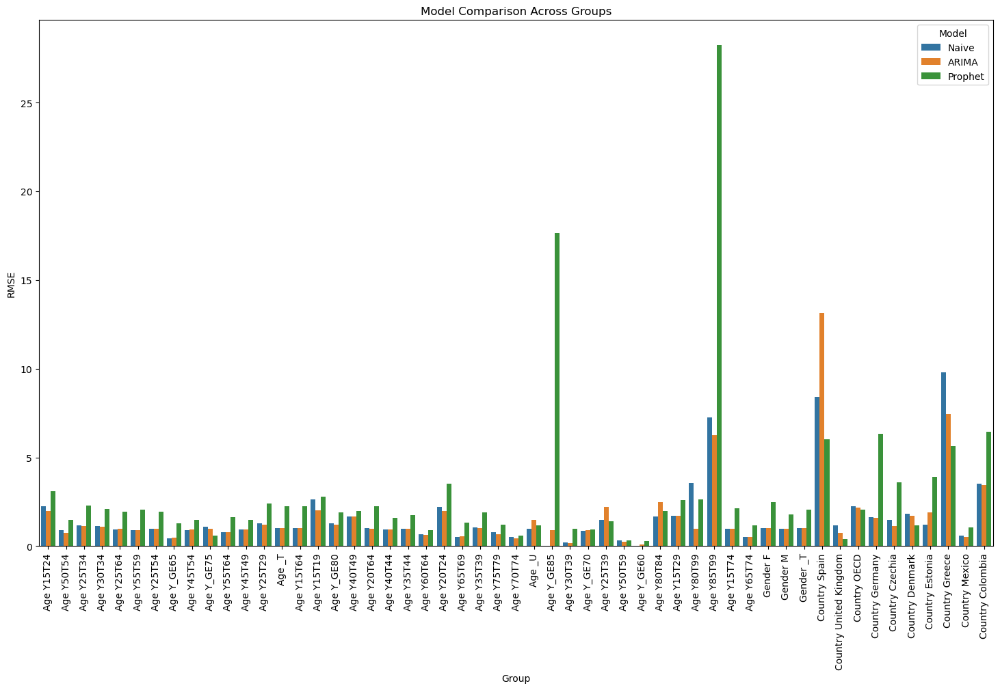

In [119]:
import seaborn as sns

plt.figure(figsize=(18,10))
sns.barplot(data=final_results, x="Group", y="RMSE", hue="Model")
plt.xticks(rotation=90)
plt.title("Model Comparison Across Groups")
plt.show()

## Trend + Volatility

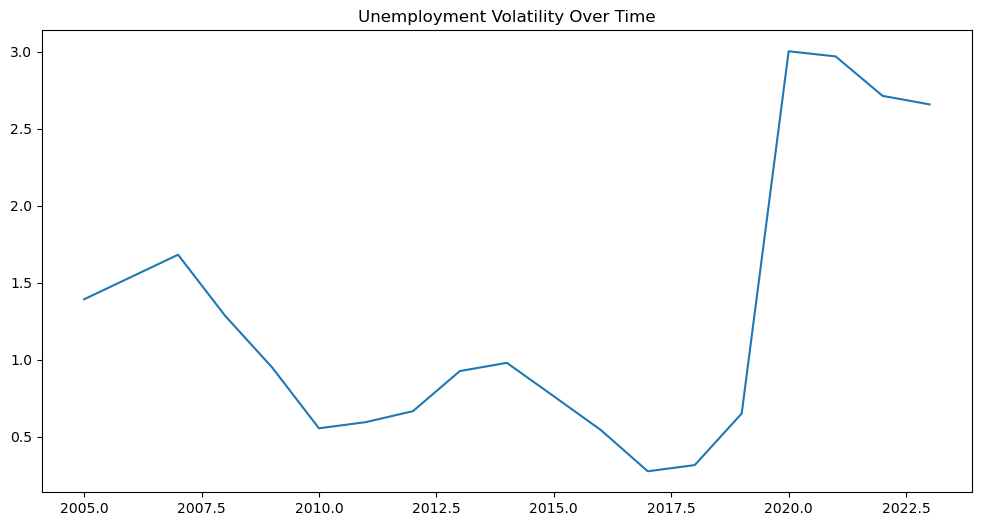

In [120]:
df_pivot['rolling_std'] = df_pivot['unemployment_rate'].rolling(5).std()

plt.figure(figsize=(12, 6))
plt.plot(df_pivot['time_period'], df_pivot['rolling_std'])
plt.title("Unemployment Volatility Over Time")
plt.show()

# **Economic Events**

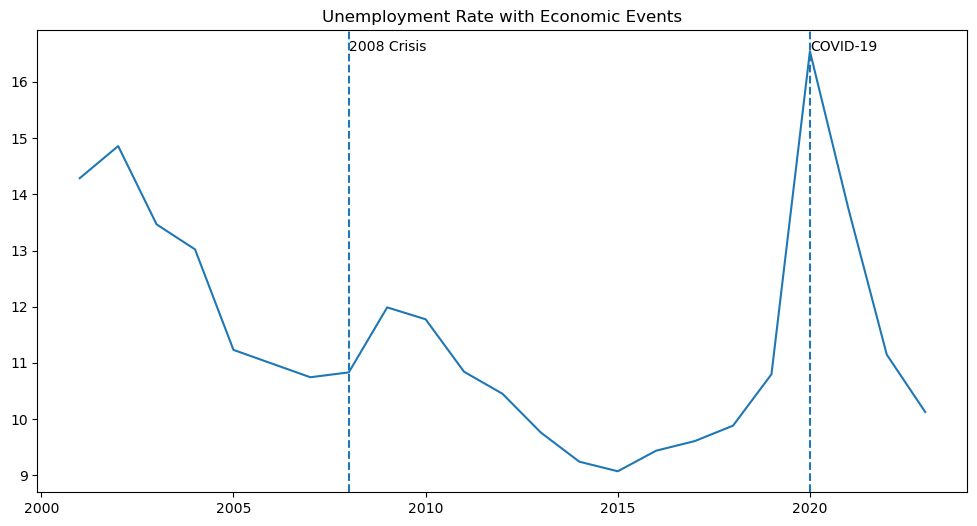

In [121]:
plt.figure(figsize=(12,6))
plt.plot(df_pivot['time_period'], df_pivot['unemployment_rate'])

# Add key events
plt.axvline(x=2008, linestyle='--')
plt.text(2008, max(df_pivot['unemployment_rate']), '2008 Crisis')

plt.axvline(x=2020, linestyle='--')
plt.text(2020, max(df_pivot['unemployment_rate']), 'COVID-19')

plt.title("Unemployment Rate with Economic Events")
plt.show()

## RMSE Heatmap

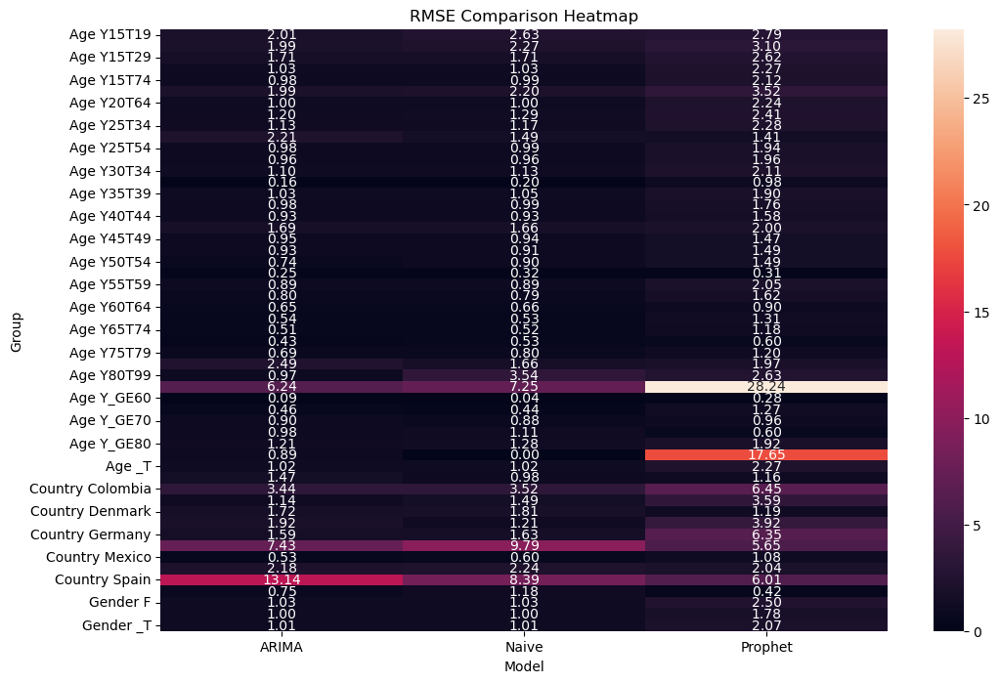

In [122]:
pivot_rmse = final_results.pivot(index="Group", columns="Model", values="RMSE")

plt.figure(figsize=(12,8))
sns.heatmap(pivot_rmse, annot=True, fmt=".2f")
plt.title("RMSE Comparison Heatmap")
plt.show()

## Age Trend Comparision

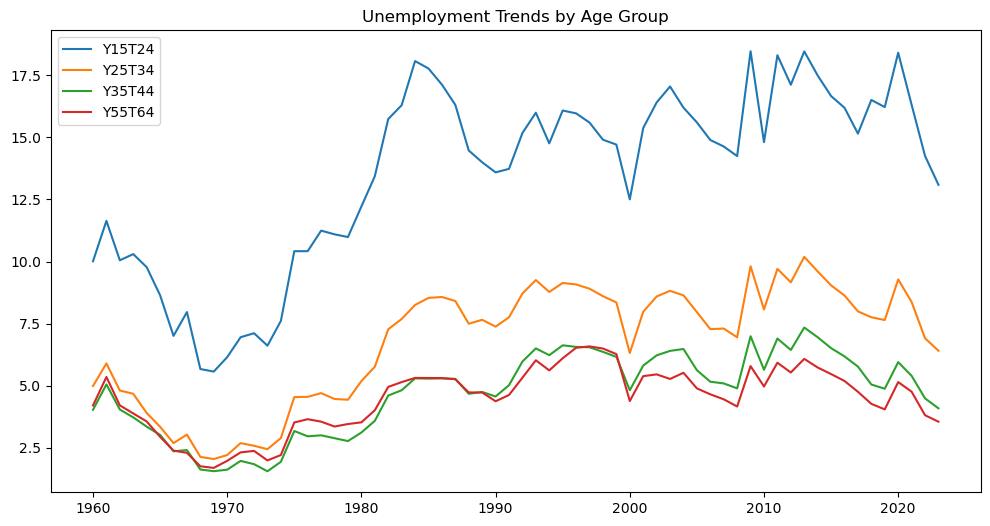

In [123]:
plt.figure(figsize=(12,6))

for age in ["Y15T24", "Y25T34", "Y35T44", "Y55T64"]:
    df_age = df[df['age'] == age]
    
    df_pivot_age = df_age.pivot_table(
        index='time_period',
        columns='labour_force_status',
        values='obs_value',
        aggfunc='mean'
    ).reset_index()

    df_pivot_age['unemployment_rate'] = (
        df_pivot_age['UNE'] / (df_pivot_age['EMP'] + df_pivot_age['UNE'])
    ) * 100

    plt.plot(df_pivot_age['time_period'], df_pivot_age['unemployment_rate'], label=age)

plt.legend()
plt.title("Unemployment Trends by Age Group")
plt.show()

## Gender Comparision

In [124]:
df['sex']

0          F
1          F
2          F
3          F
4          F
5          F
6          F
7          F
8          F
9          F
10         F
11         F
12         F
13         F
14         F
15         F
16         F
17         F
18         F
19         F
20         F
21         F
22         F
23         F
24         F
25         F
26         F
27         F
28         F
29         F
30         F
31         F
32         F
33         F
34         F
35         F
36         F
37         F
38         F
39         F
40         F
41         F
42         F
43         F
44         F
45         F
46         F
47         F
48         F
49         F
50         F
51         F
52         F
53         F
54         F
55         F
56         F
57         F
58         F
59         F
60         F
61         F
62         F
63         F
64         F
65         F
66         F
67         F
68         F
69         F
70         F
71         F
72         F
73         F
74         F
75         F
76         F

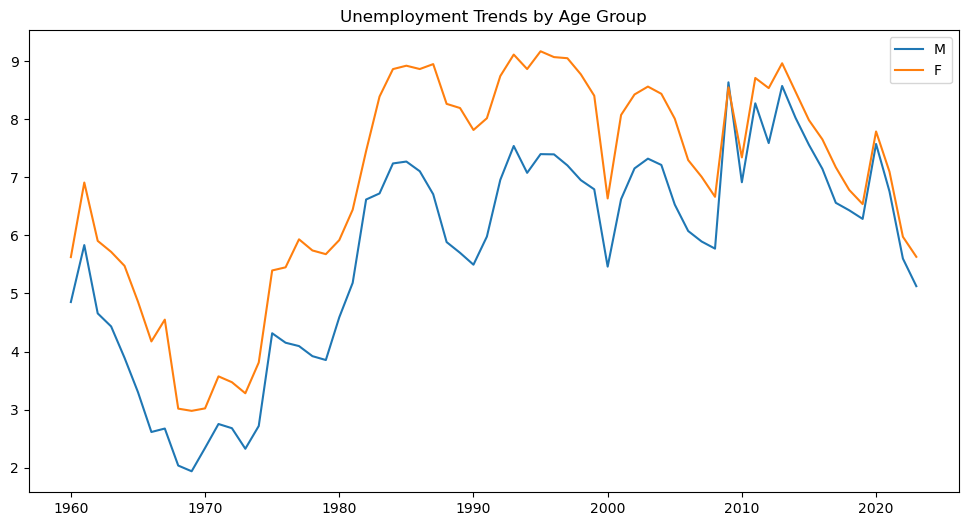

In [125]:
plt.figure(figsize=(12,6))

for sex in ["M", "F"]:
    df_sex = df[df['sex'] == sex]
    
    df_pivot_sex = df_sex.pivot_table(
        index='time_period',
        columns='labour_force_status',
        values='obs_value',
        aggfunc='mean'
    ).reset_index()

    df_pivot_sex['unemployment_rate'] = (
        df_pivot_sex['UNE'] / (df_pivot_sex['EMP'] + df_pivot_sex['UNE'])
    ) * 100

    plt.plot(df_pivot_sex['time_period'], df_pivot_sex['unemployment_rate'], label=sex)

plt.legend()
plt.title("Unemployment Trends by Age Group")
plt.show()

## Country Ranking Plot

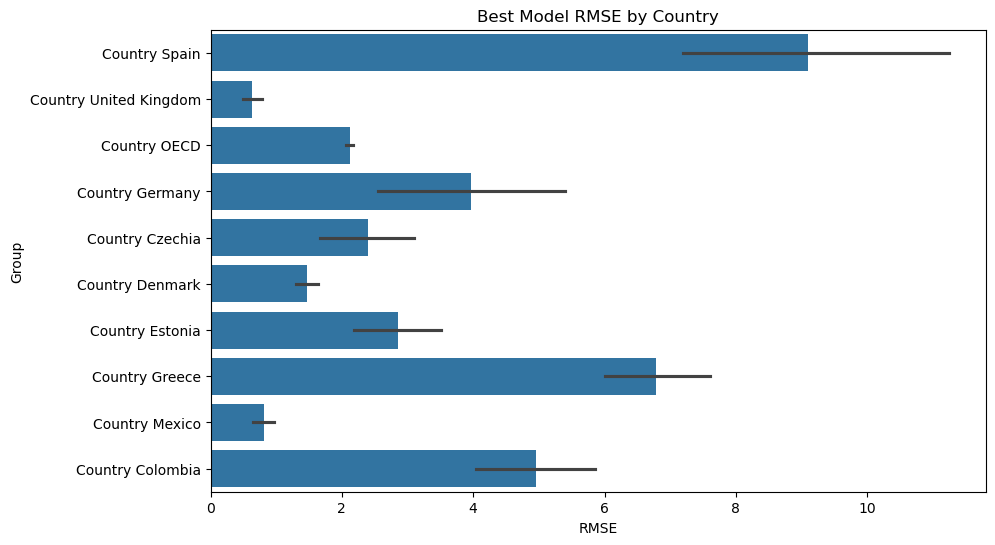

In [126]:
best_model = results_country.loc[
    results_country.groupby("Group")["RMSE"].idxmin()
]

plt.figure(figsize=(10,6))
sns.barplot(data=best_model, x="RMSE", y="Group")
plt.title("Best Model RMSE by Country")
plt.show()

## Residual Distribution

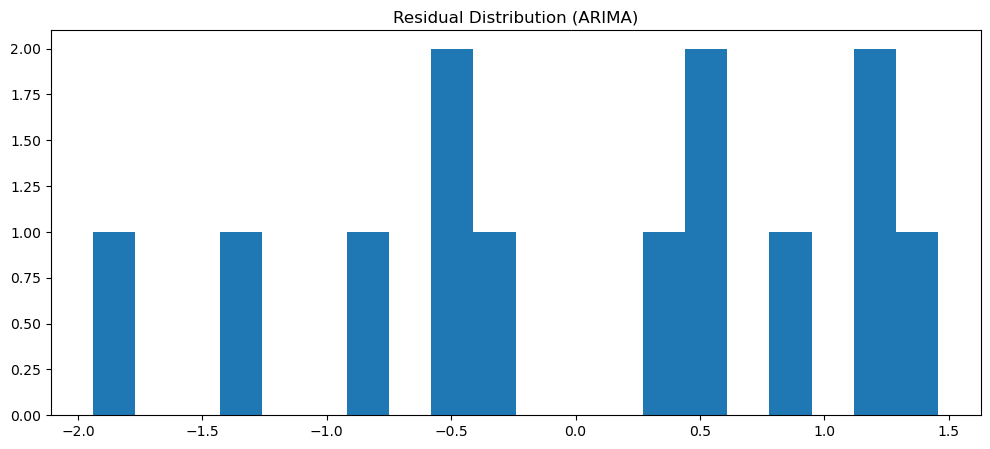

In [127]:
plt.figure(figsize=(12,5))
plt.hist(residuals_arima, bins=20)
plt.title("Residual Distribution (ARIMA)")
plt.show()

## Error by Age

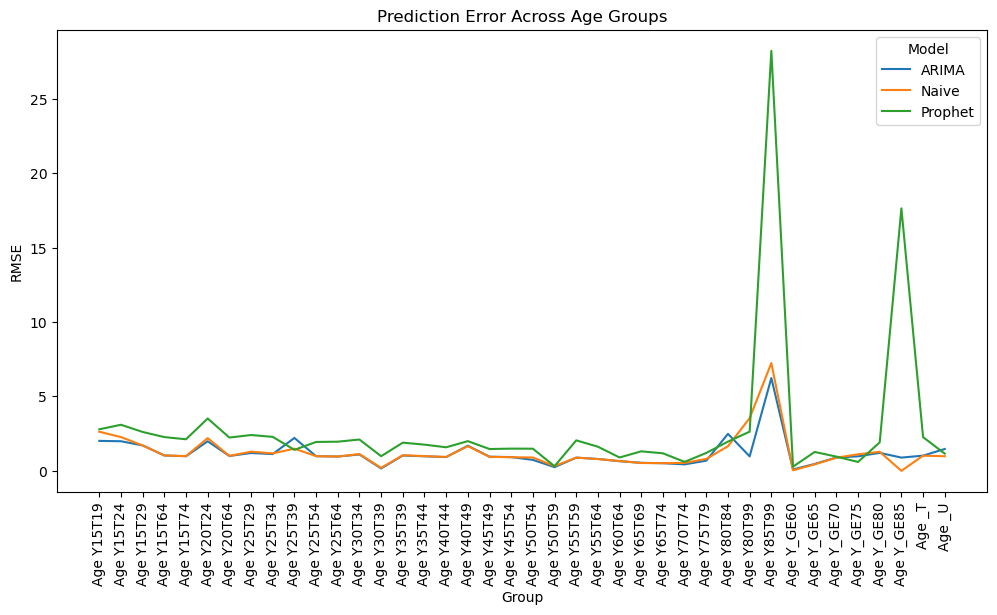

In [128]:
avg_rmse_age = results_age.groupby(["Group", "Model"])["RMSE"].mean().reset_index()

plt.figure(figsize=(12,6))
sns.lineplot(data=avg_rmse_age, x="Group", y="RMSE", hue="Model")
plt.xticks(rotation=90)
plt.title("Prediction Error Across Age Groups")
plt.show()